# **Imports**

Below are the **Imports** used in the **Notebook**.

In [1]:
# Common
import os 
import keras
import numpy as np
import pandas as pd
import tensorflow as tf

# Data 
from glob import glob
from tqdm import tqdm
import tensorflow.image as tfi
from tensorflow.keras.utils import load_img, img_to_array

# Data Visualization
import matplotlib.pyplot as plt

# Model
from keras.layers import add
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import multiply
from keras.layers import Dropout
from keras.layers import MaxPool2D
from keras.layers import Concatenate
from keras.layers import Conv2DTranspose
from keras.layers import BatchNormalization
from keras.callbacks import Callback, ModelCheckpoint
from keras.models import Model

# Model Visualization
from tensorflow.keras.utils import plot_model

# **Data Loading**

Let's load in the Data i.e. the **Images**.

In [2]:
# Root Path
image_paths = '/kaggle/input/football-semantic-segmentation/images/'

# All Images and thier respective maps
all_images = glob(image_paths + "*.jpg")
all_paths = [path.replace(".jpg",".jpg___fuse.png") for path in all_images]

In [3]:
all_images[0]

'/kaggle/input/football-semantic-segmentation/images/Frame 1  (96).jpg'

In [4]:
all_paths[0]

'/kaggle/input/football-semantic-segmentation/images/Frame 1  (96).jpg___fuse.png'

Great, we have the **exact matching pair of Images and Labels**. Now, let's load these files.

In [5]:
def load_image(path, SIZE=256):
    image = load_img(path)
    image = tfi.resize(image, (SIZE, SIZE))
    image = img_to_array(image)
    image = tf.cast(image, tf.float32)
    image = image/255.
    return image

def load_data(image_paths, label_paths, SIZE=256):
    images, label_maps = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3)), np.zeros(shape=(len(label_paths), SIZE, SIZE, 3))
    for i, (image_path, label_path) in tqdm(enumerate(zip(image_paths, label_paths)), desc="Loading"):
        image, label_map = load_image(image_path, SIZE=SIZE), load_image(label_path, SIZE=SIZE)
        images[i], label_maps[i] = image, label_map
    return images, label_maps

In [6]:
images, label_maps = load_data(all_images, all_paths)

Loading: 100it [00:07, 13.07it/s]


# **Data Visualization**

In total we have 100 Images and 100 Labels, this is a low number for training but let's see if this works. Before building the model let's visualize few images.

In [7]:
def show_map(image, label_map, alpha_1=1, alpha_2=0.7):
    plt.imshow(image, alpha=alpha_1)
    plt.imshow(label_map, alpha=alpha_2)
    plt.axis('off')

In [8]:
def show_maps(images, label_maps, GRID=[5,6], SIZE=(25,25)):
    
    # Plot Configuration
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)
    
    # Iterate through the Data
    i=1
    for image, label_map in zip(images, label_maps):
        
        # Plot Image
        plt.subplot(n_rows, n_cols, i)
        show_map(image, label_map)
        
        i+=1
        if i>n_images:
            break
    
    # Final Plot
    plt.show()

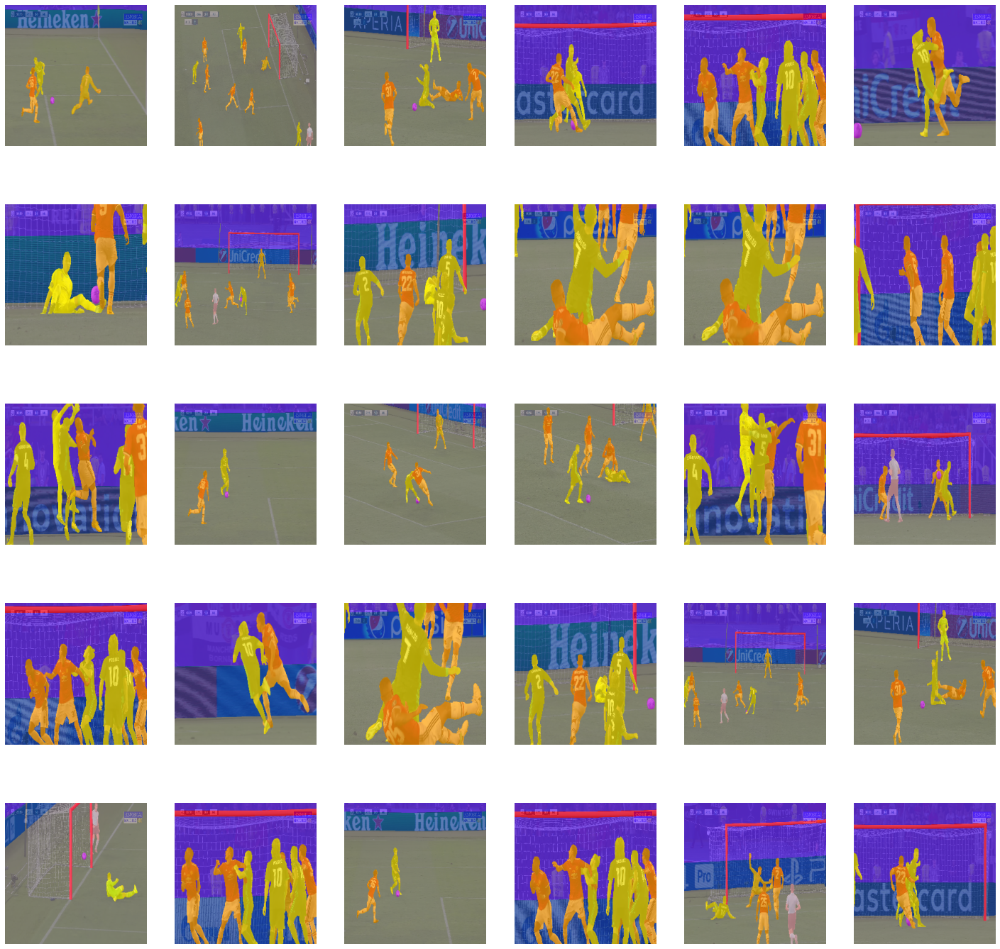

In [9]:
show_maps(images, label_maps)

# **UNet - EncoderBlock**

First, let's define the **UNet's Encoder Block**.

In [10]:
class Encoder(Layer):
    
    def __init__(self, filters, rate=0.2, pooling=True, **kwargs):
        super(Encoder, self).__init__(**kwargs)
        
        self.filters = filters
        self.rate = rate
        self.pooling = pooling
        
        self.bn = BatchNormalization()
        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()
    
    def call(self, X):
        x = self.c2(self.drop(self.c1(self.bn(X))))
        if self.pooling:
            y = self.pool(x)
            return x, y
        return x
    
    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "filters":self.filters, "rate":self.rate,"pooling":self.pooling}

# **UNet - Decoder**

Just like we created the "Encoder Block". It's time for the "Decoder Block".

In [11]:
class Decoder(Layer):
    
    def __init__(self, filters, rate, **kwargs):
        super(Decoder, self).__init__(**kwargs)
        
        self.filters = filters
        self.rate = rate
        
        self.cT = Conv2DTranspose(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.bn = BatchNormalization()
        self.skip = Concatenate()
        self.net = Encoder(filters, rate, pooling=False)
    
    def call(self, X):
        x, skip_x = X
        y = self.cT(self.bn(x))
        y = self.net(self.skip([y, skip_x]))
        return y
    
    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "filters":self.filters, "rate":self.rate}

# **UNet - Architecture**

Let's combine the **Encoder and Decoder block** to create the **UNet Architecture**.

In [12]:
# Input Layer
InputL = Input(shape=(256,256,3), name="InputImage")

# Encoder Block 
c1, p1 = Encoder(filters=64,  rate=0.1, name="Encoder1")(InputL)
c2, p2 = Encoder(filters=128, rate=0.1, name="Encoder2")(p1)
c3, p3 = Encoder(filters=256, rate=0.2, name="Encoder3")(p2)
c4, p4 = Encoder(filters=512, rate=0.2, name="Encoder4")(p3)

# Encoding Layer
encodings = Encoder(filters=512, rate=0.3, pooling=False, name="Encoding")(p4)

# Decoder Block
d = Decoder(512, 0.2, name='Decoder1')([encodings, c4])
d = Decoder(256, 0.2, name='Decoder2')([d, c3])
d = Decoder(128, 0.1, name='Decoder3')([d, c2])
d = Decoder(64, 0.1, name='Decoder4')([d, c1])

# Output
conv_out = Conv2D(3, kernel_size=3, padding='same', activation='sigmoid', name="Segmentator")(d)

# Model
model = Model(InputL, conv_out, name="UNet")
model.summary()

# Compile Model
model.compile(loss='binary_crossentropy', optimizer='adam')

Model: "UNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
InputImage (InputLayer)         [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
Encoder1 (Encoder)              ((None, 256, 256, 64 38732       InputImage[0][0]                 
__________________________________________________________________________________________________
Encoder2 (Encoder)              ((None, 128, 128, 12 221696      Encoder1[0][1]                   
__________________________________________________________________________________________________
Encoder3 (Encoder)              ((None, 64, 64, 256) 885760      Encoder2[0][1]                   
_______________________________________________________________________________________________

# **UNet - Visualization**

Let's see the **Model Architecture**.

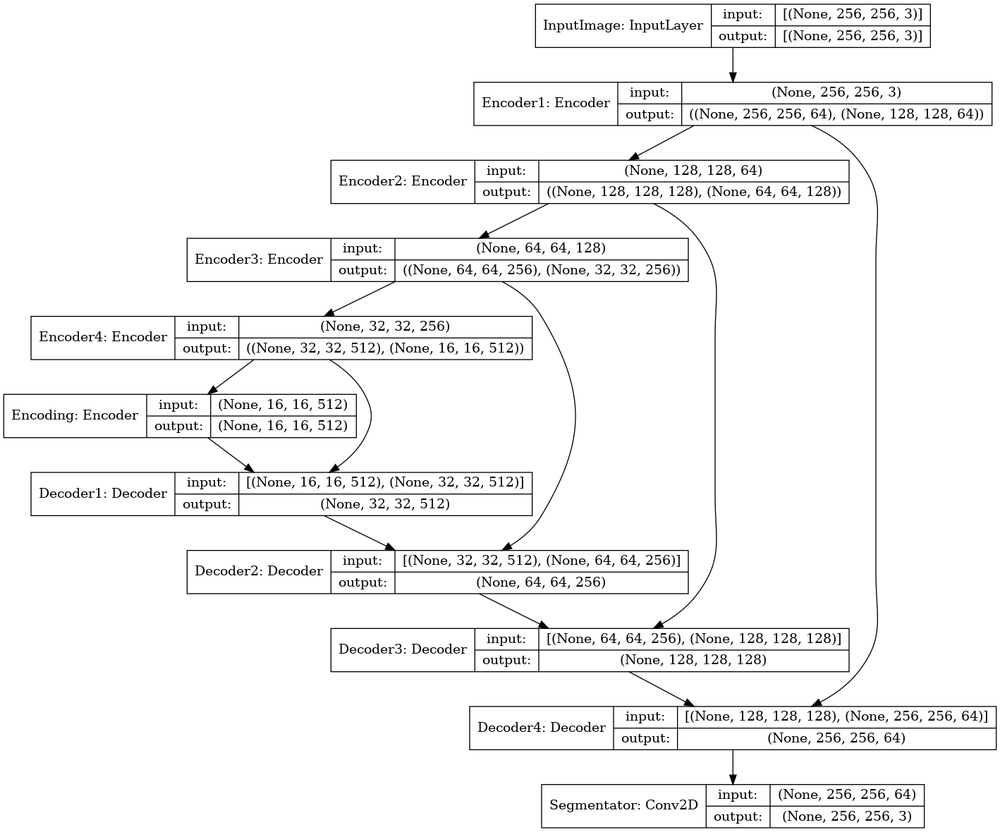

In [13]:
plot_model(model, "UNet.png", show_shapes=True)

# **UNet - Training**

In [14]:
BATCH_SIZE = 16
SPE = len(images)//BATCH_SIZE

In [15]:
def show_image(image, title=None):
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [16]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        id = np.random.randint(len(images))
        image = images[id]
        mask = label_maps[id]
        pred_mask = self.model(tf.expand_dims(image,axis=0))[0]
        
        plt.figure(figsize=(10,8))
        plt.subplot(1,3,1)
        show_image(image, title="Original Image")
        
        plt.subplot(1,3,2)
        show_image(mask, title="Original Mask")
        
        plt.subplot(1,3,3)
        show_image(pred_mask, title="Predicted Mask")
            
        plt.tight_layout()
        plt.show()

In [17]:
cbs = [ModelCheckpoint("UNet-Footbal-Player-Segmentation.h5", save_best_only=True),ShowProgress()]

Epoch 1/50
6/6 [==============================] - 380s 62s/step - loss: 0.8002 - val_loss: 167.9309


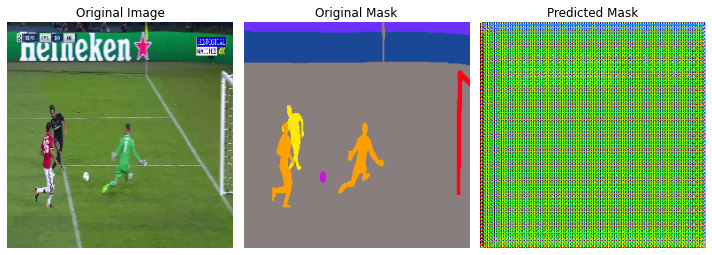

Epoch 2/50
6/6 [==============================] - 372s 62s/step - loss: 0.6802 - val_loss: 163.4304


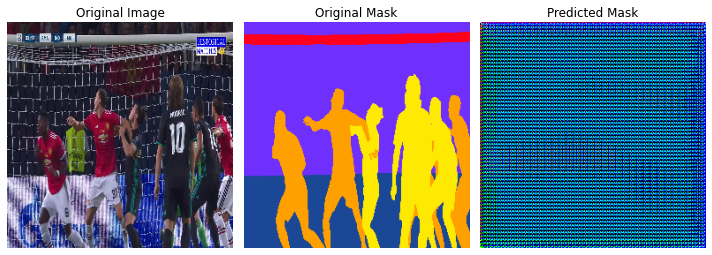

Epoch 3/50
6/6 [==============================] - 379s 63s/step - loss: 0.6500 - val_loss: 48.0043


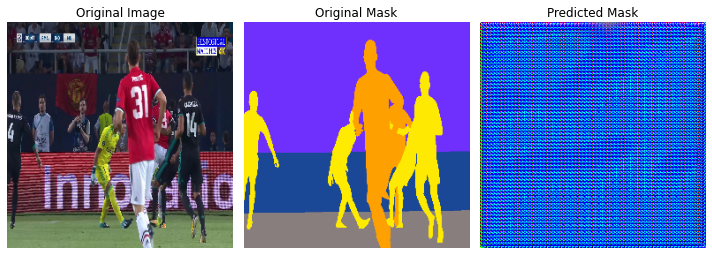

Epoch 4/50
6/6 [==============================] - 377s 62s/step - loss: 0.6244 - val_loss: 14.3174


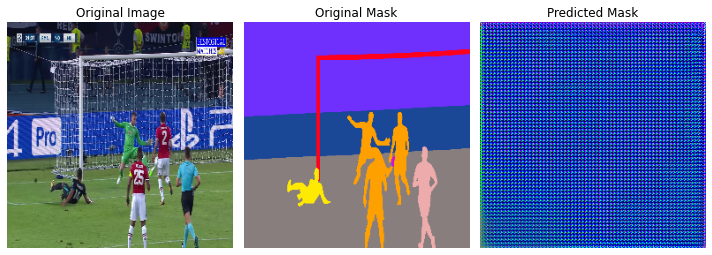

Epoch 5/50
6/6 [==============================] - 375s 62s/step - loss: 0.6103 - val_loss: 2.9012


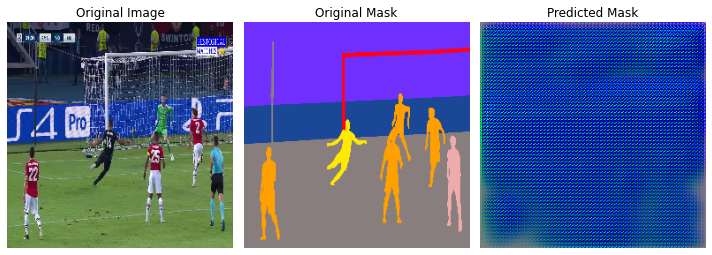

Epoch 6/50
6/6 [==============================] - 374s 62s/step - loss: 0.6077 - val_loss: 5.7052


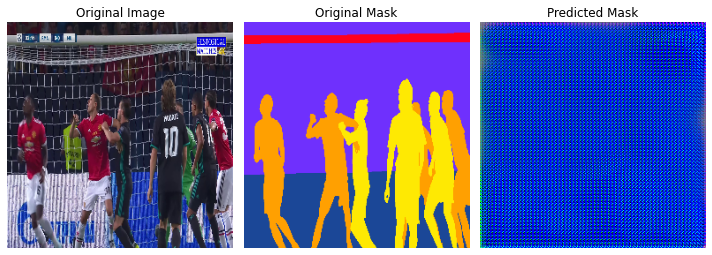

Epoch 7/50
6/6 [==============================] - 367s 61s/step - loss: 0.6013 - val_loss: 3.3358


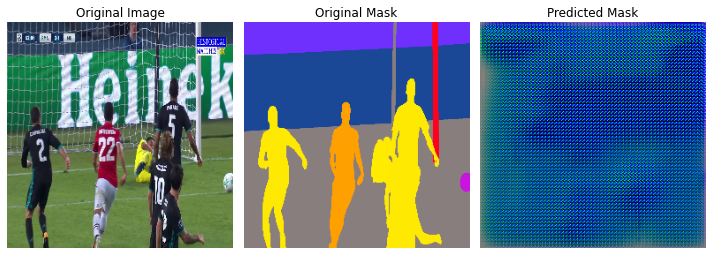

Epoch 8/50
6/6 [==============================] - 374s 62s/step - loss: 0.5959 - val_loss: 1.4172


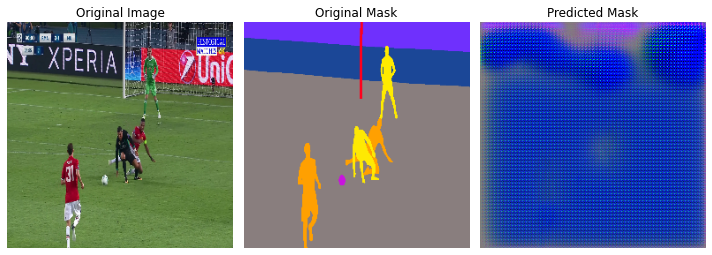

Epoch 9/50
6/6 [==============================] - 369s 61s/step - loss: 0.5807 - val_loss: 1.1145


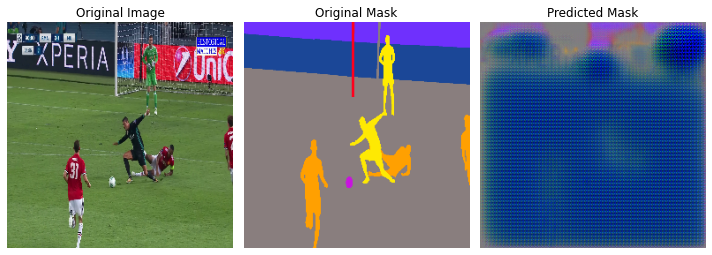

Epoch 10/50
6/6 [==============================] - 371s 61s/step - loss: 0.5679 - val_loss: 0.9169


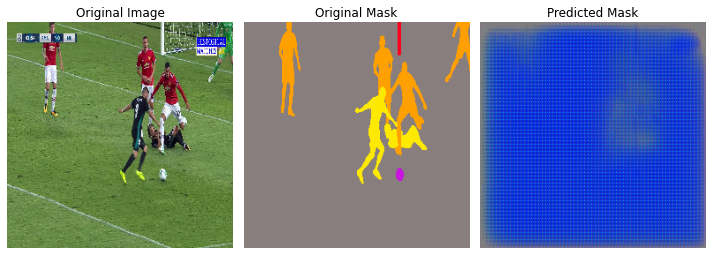

Epoch 11/50
6/6 [==============================] - 372s 62s/step - loss: 0.5735 - val_loss: 1.0654


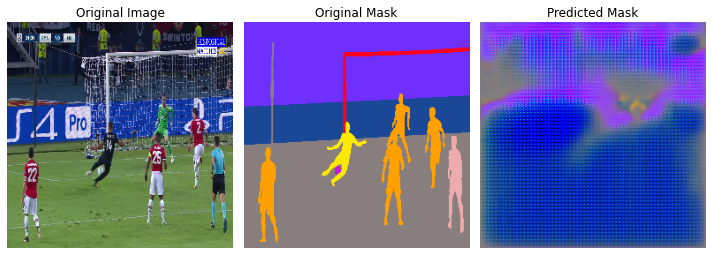

Epoch 12/50
6/6 [==============================] - 378s 62s/step - loss: 0.5649 - val_loss: 1.3194


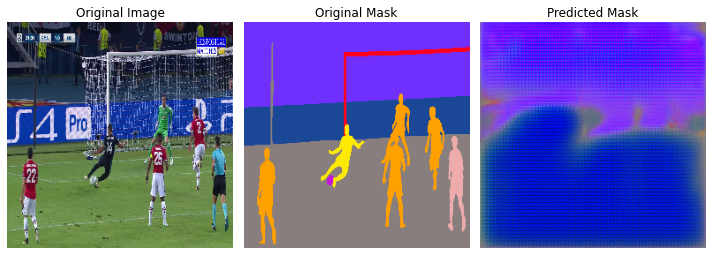

Epoch 13/50
6/6 [==============================] - 367s 60s/step - loss: 0.5659 - val_loss: 1.0162


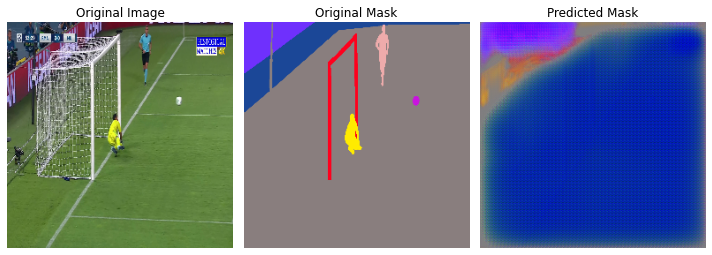

Epoch 14/50
6/6 [==============================] - 373s 61s/step - loss: 0.5577 - val_loss: 0.7438


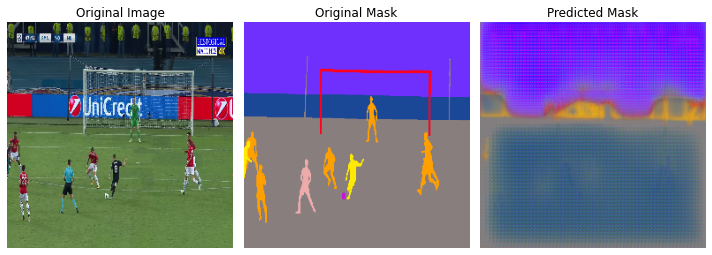

Epoch 15/50
6/6 [==============================] - 378s 63s/step - loss: 0.5491 - val_loss: 0.6557


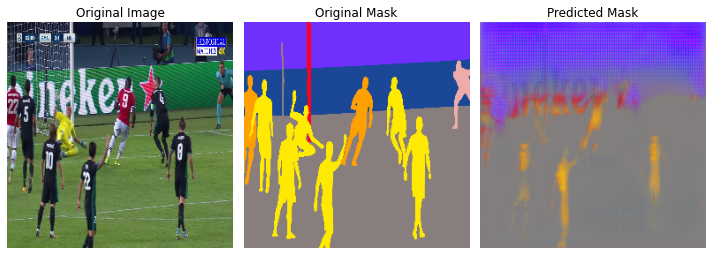

Epoch 16/50
6/6 [==============================] - 368s 61s/step - loss: 0.5501 - val_loss: 0.6628


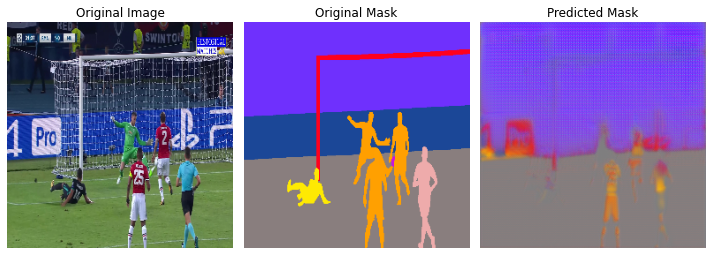

Epoch 17/50
6/6 [==============================] - 374s 62s/step - loss: 0.5484 - val_loss: 0.6596


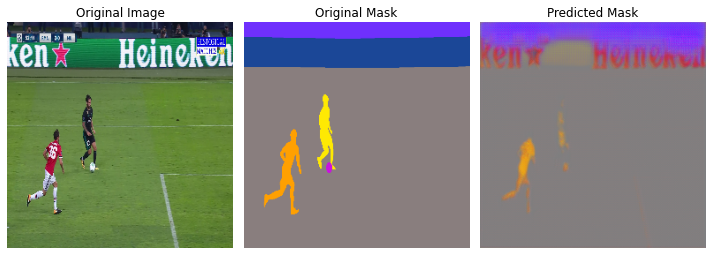

Epoch 18/50
6/6 [==============================] - 375s 62s/step - loss: 0.5439 - val_loss: 0.6703


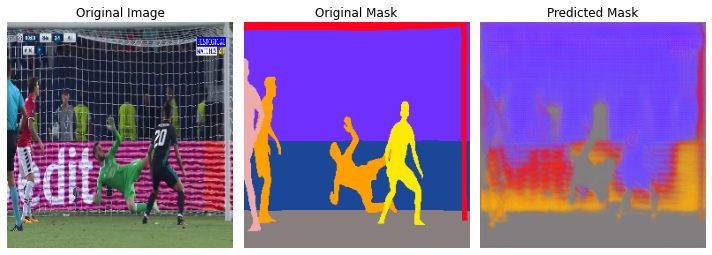

Epoch 19/50
6/6 [==============================] - 371s 62s/step - loss: 0.5427 - val_loss: 0.6931


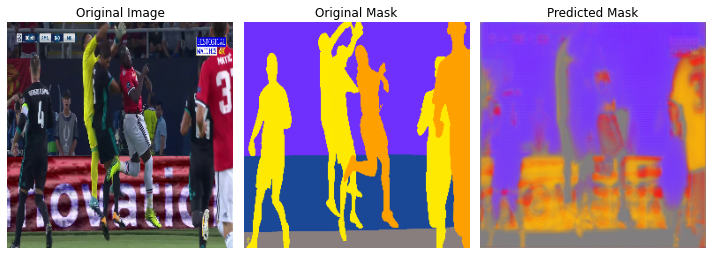

Epoch 20/50
6/6 [==============================] - 382s 63s/step - loss: 0.5416 - val_loss: 0.6811


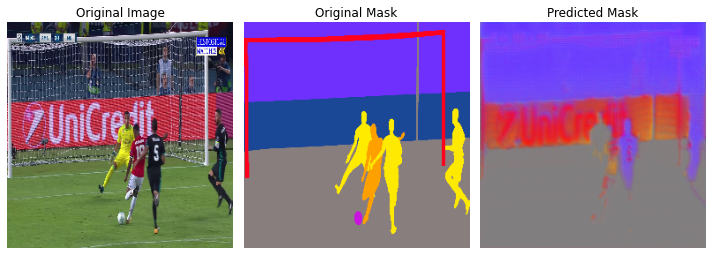

Epoch 21/50
6/6 [==============================] - 378s 62s/step - loss: 0.5423 - val_loss: 0.7197


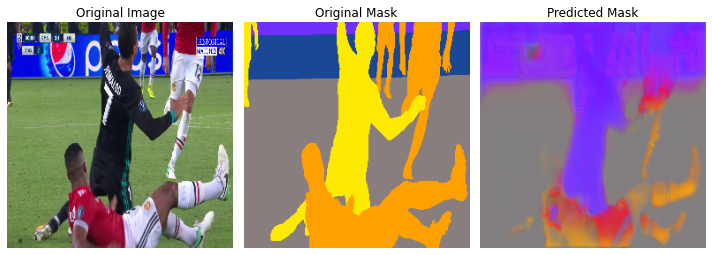

Epoch 22/50
6/6 [==============================] - 375s 62s/step - loss: 0.5386 - val_loss: 0.6997


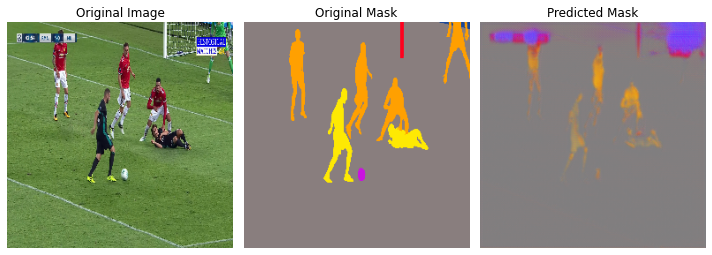

Epoch 23/50
6/6 [==============================] - 375s 62s/step - loss: 0.5370 - val_loss: 0.6920


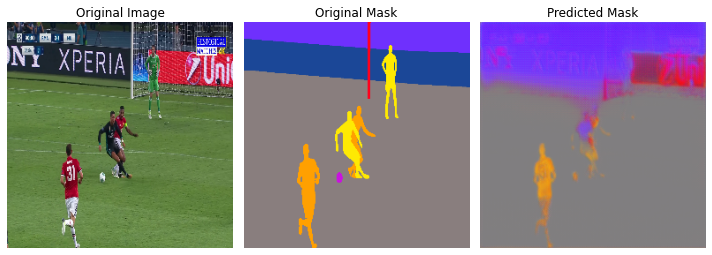

Epoch 24/50
6/6 [==============================] - 372s 61s/step - loss: 0.5348 - val_loss: 0.6958


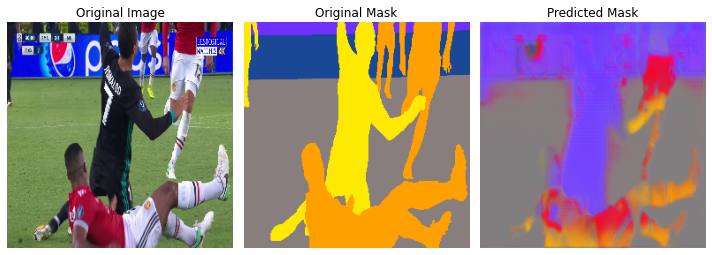

Epoch 25/50
6/6 [==============================] - 377s 62s/step - loss: 0.5345 - val_loss: 0.6988


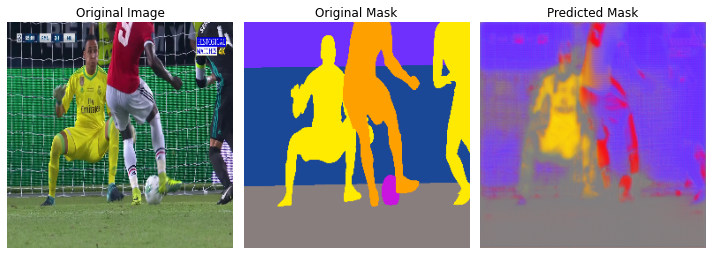

Epoch 26/50
6/6 [==============================] - 377s 62s/step - loss: 0.5302 - val_loss: 0.7495


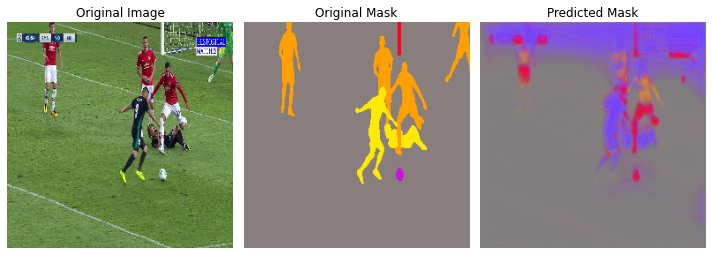

Epoch 27/50
6/6 [==============================] - 374s 62s/step - loss: 0.5331 - val_loss: 0.8118


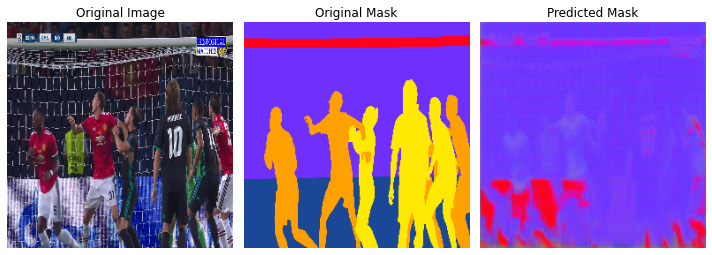

Epoch 28/50
6/6 [==============================] - 372s 61s/step - loss: 0.5262 - val_loss: 0.7058


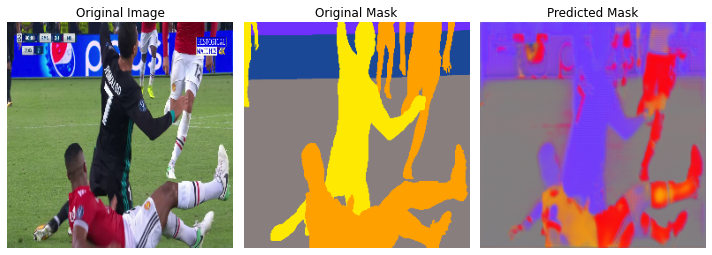

Epoch 29/50
6/6 [==============================] - 379s 62s/step - loss: 0.5265 - val_loss: 0.6521


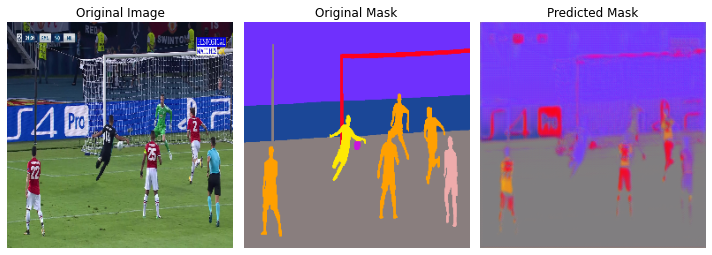

Epoch 30/50
6/6 [==============================] - 378s 63s/step - loss: 0.5243 - val_loss: 0.6444


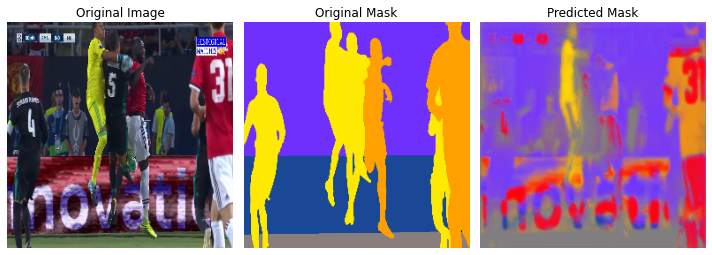

Epoch 31/50
6/6 [==============================] - 377s 62s/step - loss: 0.5230 - val_loss: 0.6483


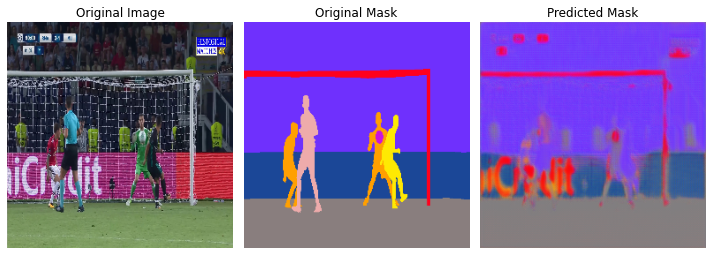

Epoch 32/50
6/6 [==============================] - 381s 63s/step - loss: 0.5225 - val_loss: 0.6597


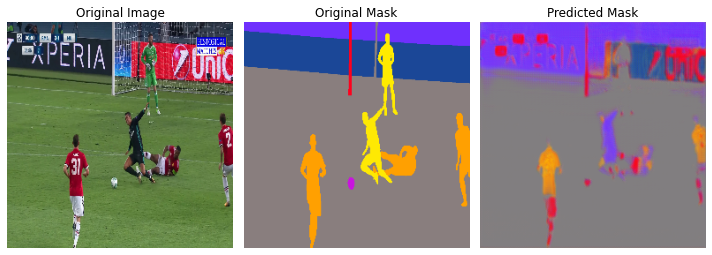

Epoch 33/50
6/6 [==============================] - 374s 62s/step - loss: 0.5218 - val_loss: 0.6699


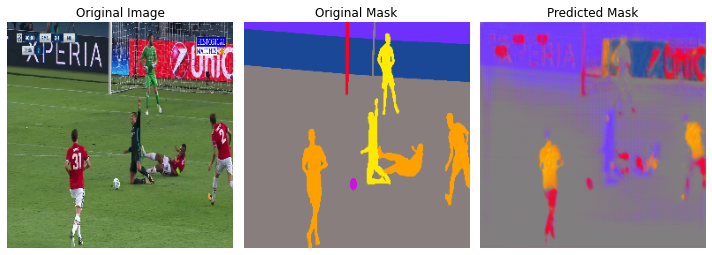

Epoch 34/50
6/6 [==============================] - 373s 61s/step - loss: 0.5225 - val_loss: 0.6741


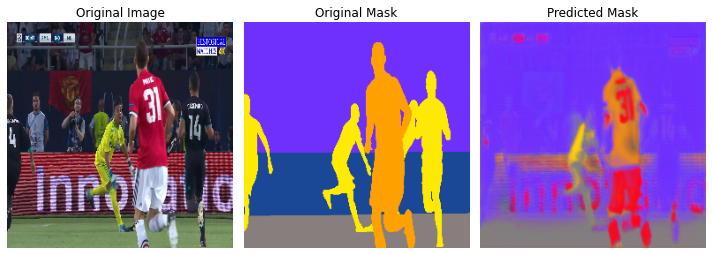

Epoch 35/50
6/6 [==============================] - 375s 62s/step - loss: 0.5215 - val_loss: 0.6563


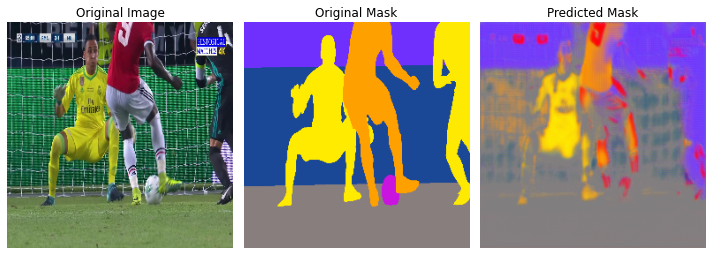

Epoch 36/50
6/6 [==============================] - 373s 62s/step - loss: 0.5202 - val_loss: 0.6539


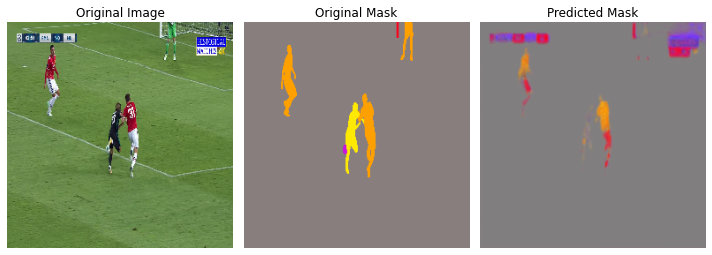

Epoch 37/50
6/6 [==============================] - 371s 61s/step - loss: 0.5191 - val_loss: 0.6670


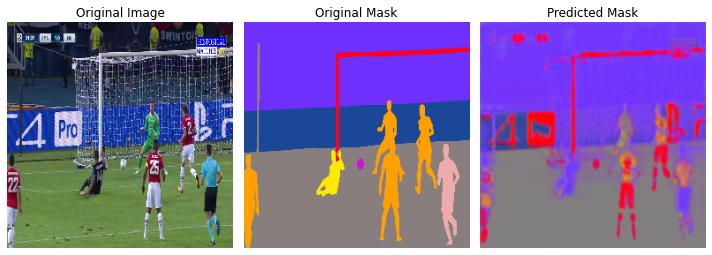

Epoch 38/50
6/6 [==============================] - 375s 62s/step - loss: 0.5188 - val_loss: 0.6828


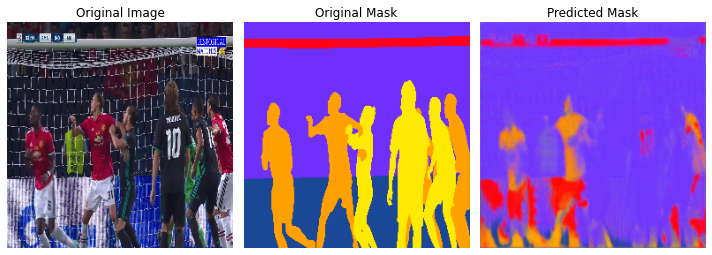

Epoch 39/50
6/6 [==============================] - 370s 61s/step - loss: 0.5177 - val_loss: 0.6240


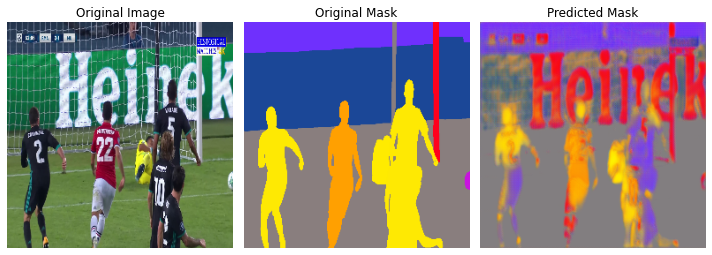

Epoch 40/50
6/6 [==============================] - 373s 61s/step - loss: 0.5201 - val_loss: 0.6287


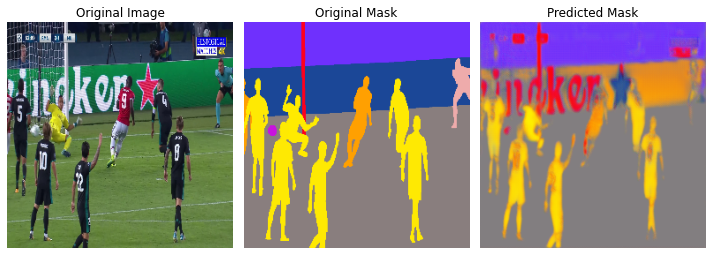

Epoch 41/50
6/6 [==============================] - 374s 62s/step - loss: 0.5194 - val_loss: 0.6756


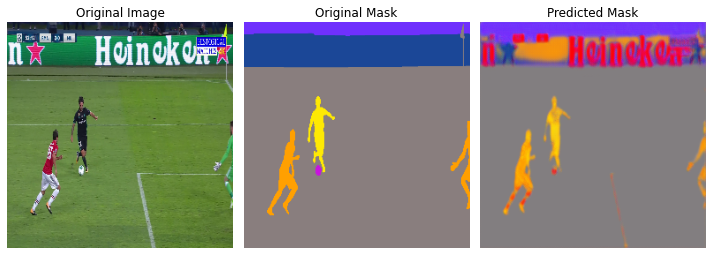

Epoch 42/50
6/6 [==============================] - 374s 62s/step - loss: 0.5182 - val_loss: 0.6164


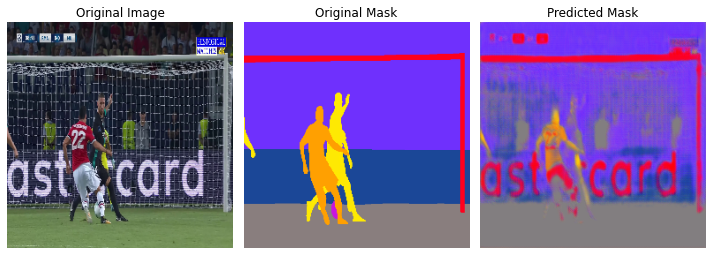

Epoch 43/50
6/6 [==============================] - 387s 64s/step - loss: 0.5159 - val_loss: 0.6284


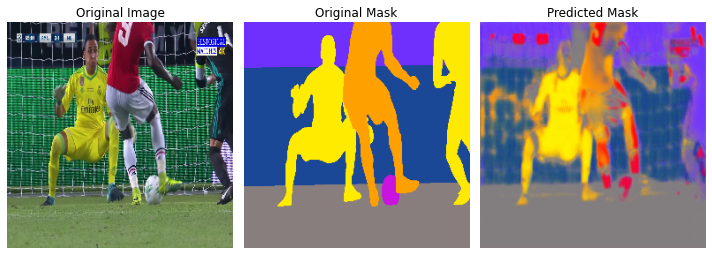

Epoch 44/50
6/6 [==============================] - 384s 63s/step - loss: 0.5153 - val_loss: 0.6221


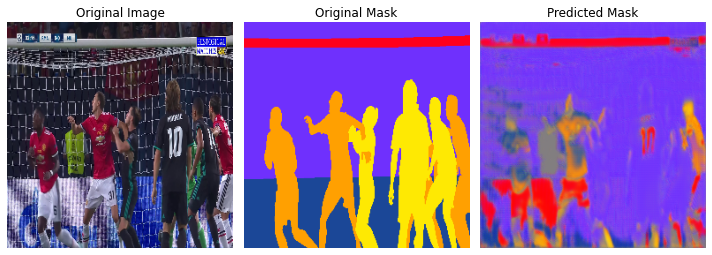

Epoch 45/50
6/6 [==============================] - 380s 63s/step - loss: 0.5167 - val_loss: 0.6132


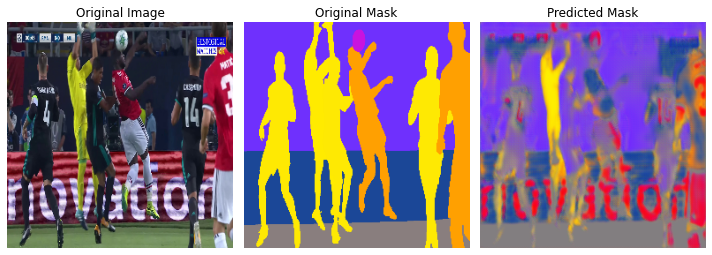

Epoch 46/50


In [ ]:
model.fit(
    images, label_maps,
    validation_split=0.1,
    epochs=50,
    batch_size=BATCH_SIZE,
    steps_per_epoch=SPE,
    callbacks=cbs
)

You can see how the Model's Segmentation Masks improves over each iteration. As total number of images is very less. It is very difficult to split the data into training, testing and validation data.

---
**DeepNets**